In [1]:
# =========================================
# [0] IMPORTS & GLOBAL CONFIG
# =========================================
import os
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

from pathlib import Path

# Set seed untuk reproduksibilitas
SEED = 42
tf.keras.utils.set_random_seed(SEED)
tf.config.experimental.enable_op_determinism()
random.seed(SEED)
np.random.seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)

# Konfigurasi global
BATCH_SIZE = 32
EPOCHS = 50
NUM_CLASSES = 4
LR = 1e-3

CLASS_NAMES = ["defect", "longberry", "peaberry", "premium"]

print("TensorFlow version:", tf.__version__)
gpus = tf.config.list_physical_devices('GPU')
print("GPU available:", len(gpus) > 0)
if gpus:
    print("GPU devices:", gpus)

2026-01-07 14:26:17.049601: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1767795977.247482      24 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1767795977.304867      24 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1767795977.807361      24 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1767795977.807408      24 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1767795977.807412      24 computation_placer.cc:177] computation placer alr

TensorFlow version: 2.19.0
GPU available: True
GPU devices: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
# =========================================
# [1] FIND PREPROCESSED ARTIFACTS
# =========================================
from pathlib import Path

# Lokasi kandidat di Kaggle (sesuaikan jika di lokal)
CANDIDATE_PATHS = [
    Path("/kaggle/input/coffe-bean-classification-preprocessing/artifacts_preprocess"),
    Path("/kaggle/input/coffee-bean-classification-preprocessing/artifacts_preprocess"),
    Path("/kaggle/input/coffe-bean-classification-preprocessing"),  # fallback jika nama beda sedikit
]

ART_DIR = None

# Cari folder yang berisi split_train.csv dan split_val.csv
for base in CANDIDATE_PATHS:
    if base.exists():
        # Cari subfolder artifacts_preprocess jika perlu
        possible_dirs = [base] if (base / "split_train.csv").exists() else list(base.rglob("artifacts_preprocess"))
        for p in possible_dirs:
            if (p / "split_train.csv").exists() and (p / "split_val.csv").exists():
                ART_DIR = p
                break
    if ART_DIR:
        break

# Jika masih None, scan semua /kaggle/input
if ART_DIR is None:
    input_dir = Path("/kaggle/input")
    if input_dir.exists():
        for dataset_dir in input_dir.iterdir():
            if dataset_dir.is_dir():
                for p in dataset_dir.rglob("artifacts_preprocess"):
                    if (p / "split_train.csv").exists() and (p / "split_val.csv").exists():
                        ART_DIR = p
                        break
                if ART_DIR:
                    break

if ART_DIR is None:
    raise FileNotFoundError(
        "❌ Tidak dapat menemukan folder 'artifacts_preprocess' yang berisi split_train.csv dan split_val.csv.\n"
        "Pastikan dataset preprocessing sudah di-attach dengan benar di panel 'Data'."
    )

print(f"✅ Artifacts ditemukan di: {ART_DIR}")
print("   ├── split_train.csv :", (ART_DIR / "split_train.csv").exists())
print("   ├── split_val.csv   :", (ART_DIR / "split_val.csv").exists())
print("   └── split_test.csv  :", (ART_DIR / "split_test.csv").exists())

✅ Artifacts ditemukan di: /kaggle/input/coffe-bean-classification-preprocessing/artifacts_preprocess
   ├── split_train.csv : True
   ├── split_val.csv   : True
   └── split_test.csv  : True


In [3]:
# =========================================
# [2] LOAD DATAFRAMES
# =========================================
train_df = pd.read_csv(ART_DIR / "split_train.csv")
val_df   = pd.read_csv(ART_DIR / "split_val.csv")

# Test opsional
test_path = ART_DIR / "split_test.csv"
test_df = pd.read_csv(test_path) if test_path.exists() else None

print(f"Train samples  : {len(train_df)}")
print(f"Val samples    : {len(val_df)}")
print(f"Test samples   : {len(test_df) if test_df is not None else 'N/A'}")

# Tampilkan distribusi kelas
print("\nDistribusi kelas di training set:")
print(train_df["class_name"].value_counts().sort_index())

print("\nDistribusi kelas di validation set:")
print(val_df["class_name"].value_counts().sort_index())

train_df.head(3)

Train samples  : 840
Val samples    : 187
Test samples   : 173

Distribusi kelas di training set:
class_name
defect       210
longberry    210
peaberry     211
premium      209
Name: count, dtype: int64

Distribusi kelas di validation set:
class_name
defect       46
longberry    47
peaberry     45
premium      49
Name: count, dtype: int64


,filepath,filename,class_name,class_id,group_id
0,/kaggle/input/coffee-bean-classification-datas...,0.jpg,defect,0,0
1,/kaggle/input/coffee-bean-classification-datas...,10.jpg,defect,0,2
2,/kaggle/input/coffee-bean-classification-datas...,100.jpg,defect,0,3


In [4]:
# =========================================
# [3] TF.DATA PIPELINE (ROBUST & REUSABLE)
# =========================================
AUTOTUNE = tf.data.AUTOTUNE

def decode_and_resize(image_path, label, target_size):
    """Baca dan preprocess gambar"""
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)  # semua gambar adalah JPEG
    img = tf.image.resize(img, target_size, method="bilinear")
    img = tf.cast(img, tf.float32)
    return img, label

def create_dataset(df, target_size, training=True, batch_size=BATCH_SIZE):
    """Buat tf.data.Dataset yang siap dipakai untuk training/eval"""
    paths = df["filepath"].values
    labels = df["class_id"].values.astype(np.int32)
    
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    
    if training:
        ds = ds.shuffle(buffer_size=len(df), seed=SEED, reshuffle_each_iteration=True)
    
    ds = ds.map(lambda p, l: decode_and_resize(p, l, target_size),
                num_parallel_calls=AUTOTUNE)
    
    ds = ds.batch(batch_size)
    ds = ds.prefetch(AUTOTUNE)
    
    return ds

print("✅ Fungsi create_dataset() siap digunakan dengan target_size fleksibel")

✅ Fungsi create_dataset() siap digunakan dengan target_size fleksibel


In [5]:
# =========================================
# [4] HELPER FUNCTIONS UNTUK EVALUASI
# =========================================
from sklearn.metrics import confusion_matrix, classification_report

def plot_history(history, title="Training History"):
    """Plot loss & accuracy"""
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.plot(history.history["loss"], label="Train Loss")
    plt.plot(history.history["val_loss"], label="Val Loss")
    plt.title("Loss")
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(history.history["accuracy"], label="Train Acc")
    plt.plot(history.history["val_accuracy"], label="Val Acc")
    plt.title("Accuracy")
    plt.legend()
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

def evaluate_model(model, dataset, dataset_name="Validation"):
    """Confusion matrix + classification report"""
    y_true = []
    y_pred = []
    
    for images, labels in dataset:
        preds = model.predict(images, verbose=0)
        y_pred.extend(np.argmax(preds, axis=1))
        y_true.extend(labels.numpy())
    
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap="Blues")
    plt.title(f"Confusion Matrix - {dataset_name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.xticks(range(NUM_CLASSES), CLASS_NAMES, rotation=45)
    plt.yticks(range(NUM_CLASSES), CLASS_NAMES)
    for i in range(NUM_CLASSES):
        for j in range(NUM_CLASSES):
            plt.text(j, i, cm[i, j], ha="center", va="center",
                     color="white" if cm[i, j] > cm.max()/2 else "black")
    plt.tight_layout()
    plt.show()
    
    # Classification Report
    print(classification_report(y_true, y_pred, target_names=CLASS_NAMES, digits=4))
    
    return cm

print("✅ Semua persiapan selesai! Pipeline data sudah rapi dan stabil.")

✅ Semua persiapan selesai! Pipeline data sudah rapi dan stabil.


In [6]:
# =========================================
# [5] MODEL BUILDERS (GENERIC & CLEAN)
# =========================================
from tensorflow.keras import layers, models

# Ukuran input canonical per EfficientNet variant
EFFNET_IMG_SIZES = {
    "B0": (224, 224),
    "B1": (240, 240),
    "B2": (260, 260),
    "B3": (300, 300),
}

def build_resnet50(freeze_backbone=True):
    base = tf.keras.applications.ResNet50(
        include_top=False,
        weights="imagenet",
        input_shape=(224, 224, 3)
    )
    base.trainable = not freeze_backbone
    
    inputs = layers.Input(shape=(224, 224, 3))
    x = tf.keras.applications.resnet.preprocess_input(inputs)
    x = base(x, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
    
    model = models.Model(inputs, outputs, name="ResNet50")
    return model

def build_efficientnet(variant="B0", freeze_backbone=True):
    if variant not in EFFNET_IMG_SIZES:
        raise ValueError(f"Variant {variant} tidak didukung. Pilih dari {list(EFFNET_IMG_SIZES.keys())}")
    
    img_size = EFFNET_IMG_SIZES[variant]
    base_model_fn = {
        "B0": tf.keras.applications.EfficientNetB0,
        "B1": tf.keras.applications.EfficientNetB1,
        "B2": tf.keras.applications.EfficientNetB2,
        "B3": tf.keras.applications.EfficientNetB3,
    }[variant]
    
    base = base_model_fn(
        include_top=False,
        weights="imagenet",
        input_shape=(*img_size, 3)
    )
    base.trainable = not freeze_backbone
    
    inputs = layers.Input(shape=(*img_size, 3))
    x = tf.keras.applications.efficientnet.preprocess_input(inputs)
    x = base(x, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
    
    model = models.Model(inputs, outputs, name=f"EfficientNet{variant}")
    return model

def build_mobilenetv2(freeze_backbone=True):
    base = tf.keras.applications.MobileNetV2(
        include_top=False,
        weights="imagenet",
        input_shape=(224, 224, 3)
    )
    base.trainable = not freeze_backbone
    
    inputs = layers.Input(shape=(224, 224, 3))
    x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
    x = base(x, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
    
    model = models.Model(inputs, outputs, name="MobileNetV2")
    return model

print("✅ Semua model builder siap: ResNet50, EfficientNet B0–B3, MobileNetV2")

✅ Semua model builder siap: ResNet50, EfficientNet B0–B3, MobileNetV2


🚀 Mulai melatih 6 model...

[ResNet50] Memulai training | Input size: (224, 224)


I0000 00:00:1767795991.211165      24 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/50


I0000 00:00:1767796001.662481      63 cuda_dnn.cc:529] Loaded cuDNN version 91002


27/27 ━━━━━━━━━━━━━━━━━━━━ 14s 184ms/step - accuracy: 0.3908 - loss: 1.4648 - val_accuracy: 0.7594 - val_loss: 0.6691 - learning_rate: 0.0010
Epoch 2/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - accuracy: 0.7291 - loss: 0.7237 - val_accuracy: 0.8449 - val_loss: 0.4664 - learning_rate: 0.0010
Epoch 3/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.7770 - loss: 0.5580 - val_accuracy: 0.8610 - val_loss: 0.4288 - learning_rate: 0.0010
Epoch 4/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.8020 - loss: 0.5531 - val_accuracy: 0.8770 - val_loss: 0.3665 - learning_rate: 0.0010
Epoch 5/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - accuracy: 0.8410 - loss: 0.4326 - val_accuracy: 0.9091 - val_loss: 0.3137 - learning_rate: 0.0010
Epoch 6/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - accuracy: 0.8503 - loss: 0.4194 - val_accuracy: 0.8877 - val_loss: 0.3481 - learning_rate: 0.0010
Epoch 7/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - accuracy: 0.8790 - loss: 0.3388 - val_accuracy: 0.

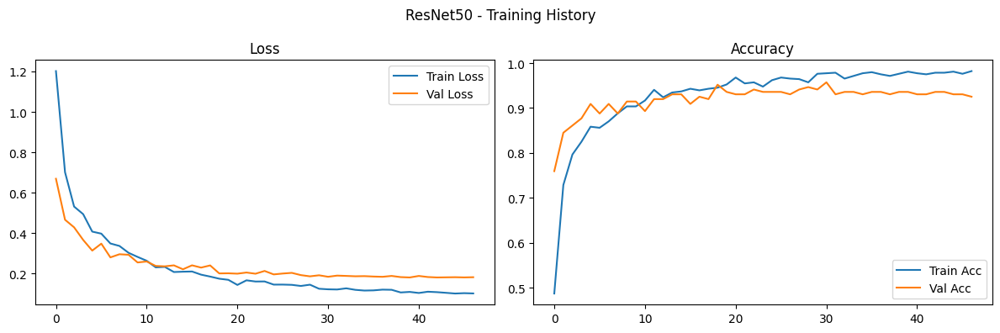

2026-01-07 14:28:45.137336: E tensorflow/core/framework/node_def_util.cc:680] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}


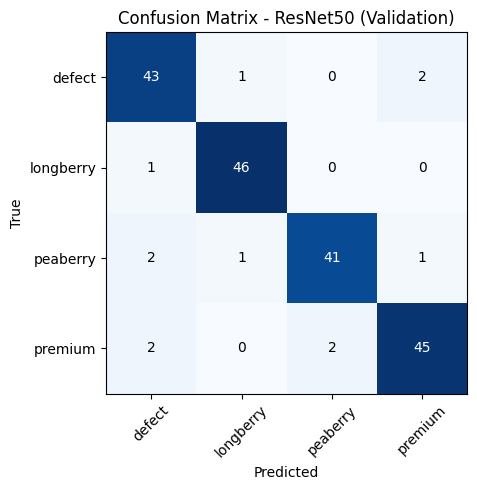

              precision    recall  f1-score   support

      defect     0.8958    0.9348    0.9149        46
   longberry     0.9583    0.9787    0.9684        47
    peaberry     0.9535    0.9111    0.9318        45
     premium     0.9375    0.9184    0.9278        49

    accuracy                         0.9358       187
   macro avg     0.9363    0.9357    0.9357       187
weighted avg     0.9363    0.9358    0.9358       187

✅ ResNet50 selesai dilatih dan dievaluasi.

[EfficientNetB0] Memulai training | Input size: (224, 224)
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/50


E0000 00:00:1767796136.790983      24 meta_optimizer.cc:967] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/EfficientNetB0_1/efficientnetb0_1/block2b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


27/27 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - accuracy: 0.4605 - loss: 1.2611 - val_accuracy: 0.6471 - val_loss: 0.8757 - learning_rate: 0.0010
Epoch 2/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.6655 - loss: 0.9082 - val_accuracy: 0.8182 - val_loss: 0.6514 - learning_rate: 0.0010
Epoch 3/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.7508 - loss: 0.7483 - val_accuracy: 0.8663 - val_loss: 0.5423 - learning_rate: 0.0010
Epoch 4/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.7946 - loss: 0.6257 - val_accuracy: 0.8930 - val_loss: 0.4817 - learning_rate: 0.0010
Epoch 5/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.7967 - loss: 0.5702 - val_accuracy: 0.9091 - val_loss: 0.4366 - learning_rate: 0.0010
Epoch 6/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.8072 - loss: 0.5252 - val_accuracy: 0.9091 - val_loss: 0.4080 - learning_rate: 0.0010
Epoch 7/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.8295 - loss: 0.4960 - val_accuracy: 0.

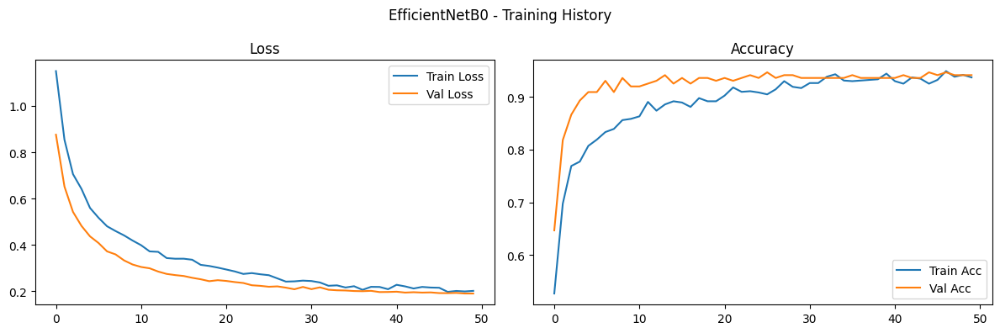

2026-01-07 14:30:22.102125: E tensorflow/core/framework/node_def_util.cc:680] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}


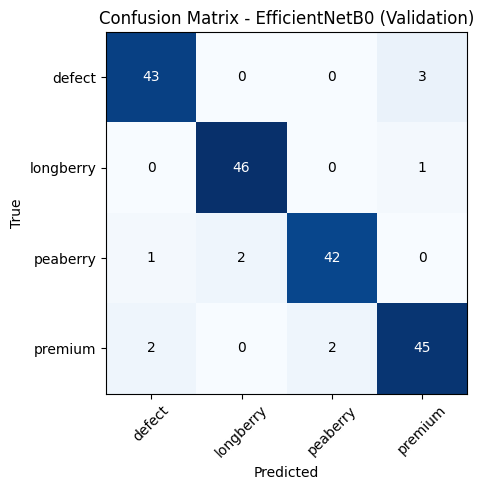

              precision    recall  f1-score   support

      defect     0.9348    0.9348    0.9348        46
   longberry     0.9583    0.9787    0.9684        47
    peaberry     0.9545    0.9333    0.9438        45
     premium     0.9184    0.9184    0.9184        49

    accuracy                         0.9412       187
   macro avg     0.9415    0.9413    0.9413       187
weighted avg     0.9412    0.9412    0.9411       187

✅ EfficientNetB0 selesai dilatih dan dievaluasi.

[EfficientNetB1] Memulai training | Input size: (240, 240)
27018416/27018416 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/50


E0000 00:00:1767796237.704813      24 meta_optimizer.cc:967] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/EfficientNetB1_1/efficientnetb1_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


27/27 ━━━━━━━━━━━━━━━━━━━━ 18s 228ms/step - accuracy: 0.2717 - loss: 1.4954 - val_accuracy: 0.6471 - val_loss: 0.9772 - learning_rate: 0.0010
Epoch 2/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - accuracy: 0.5958 - loss: 1.0082 - val_accuracy: 0.8021 - val_loss: 0.7369 - learning_rate: 0.0010
Epoch 3/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - accuracy: 0.6980 - loss: 0.8022 - val_accuracy: 0.8235 - val_loss: 0.6212 - learning_rate: 0.0010
Epoch 4/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - accuracy: 0.7762 - loss: 0.6447 - val_accuracy: 0.8342 - val_loss: 0.5572 - learning_rate: 0.0010
Epoch 5/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - accuracy: 0.7702 - loss: 0.6510 - val_accuracy: 0.8449 - val_loss: 0.5029 - learning_rate: 0.0010
Epoch 6/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - accuracy: 0.7907 - loss: 0.5866 - val_accuracy: 0.8503 - val_loss: 0.4642 - learning_rate: 0.0010
Epoch 7/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - accuracy: 0.7963 - loss: 0.5483 - val_accuracy: 0.

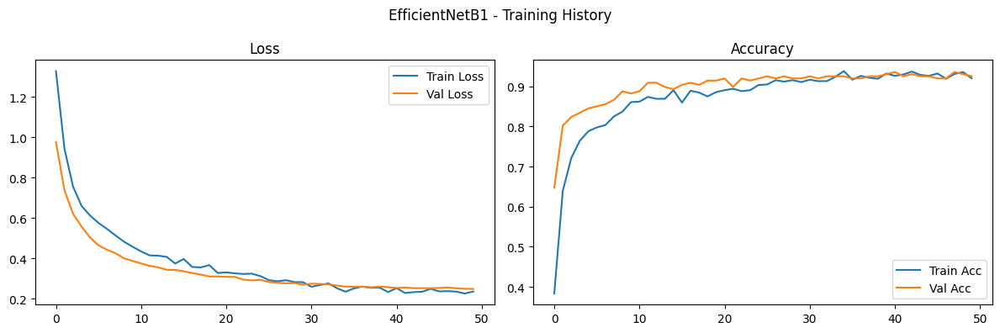

2026-01-07 14:32:45.769619: E tensorflow/core/framework/node_def_util.cc:680] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}


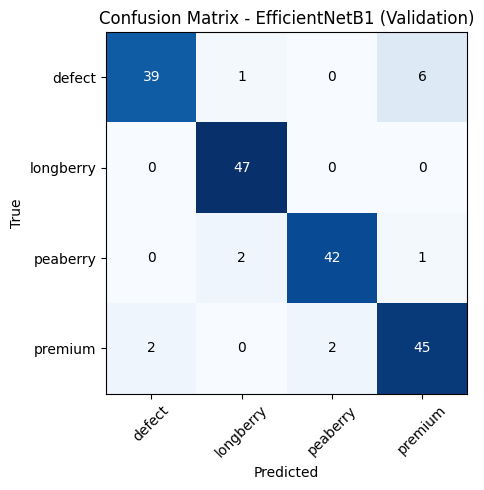

              precision    recall  f1-score   support

      defect     0.9512    0.8478    0.8966        46
   longberry     0.9400    1.0000    0.9691        47
    peaberry     0.9545    0.9333    0.9438        45
     premium     0.8654    0.9184    0.8911        49

    accuracy                         0.9251       187
   macro avg     0.9278    0.9249    0.9251       187
weighted avg     0.9267    0.9251    0.9247       187

✅ EfficientNetB1 selesai dilatih dan dievaluasi.

[EfficientNetB2] Memulai training | Input size: (260, 260)
31790344/31790344 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/50


E0000 00:00:1767796382.757734      24 meta_optimizer.cc:967] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/EfficientNetB2_1/efficientnetb2_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


27/27 ━━━━━━━━━━━━━━━━━━━━ 19s 253ms/step - accuracy: 0.4197 - loss: 1.2826 - val_accuracy: 0.6578 - val_loss: 0.9155 - learning_rate: 0.0010
Epoch 2/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - accuracy: 0.6390 - loss: 0.9279 - val_accuracy: 0.7914 - val_loss: 0.6774 - learning_rate: 0.0010
Epoch 3/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - accuracy: 0.7209 - loss: 0.7840 - val_accuracy: 0.8289 - val_loss: 0.5841 - learning_rate: 0.0010
Epoch 4/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - accuracy: 0.7976 - loss: 0.6466 - val_accuracy: 0.8610 - val_loss: 0.5222 - learning_rate: 0.0010
Epoch 5/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - accuracy: 0.7961 - loss: 0.5955 - val_accuracy: 0.8717 - val_loss: 0.4778 - learning_rate: 0.0010
Epoch 6/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - accuracy: 0.8371 - loss: 0.5613 - val_accuracy: 0.8824 - val_loss: 0.4530 - learning_rate: 0.0010
Epoch 7/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - accuracy: 0.8197 - loss: 0.5247 - val_accura

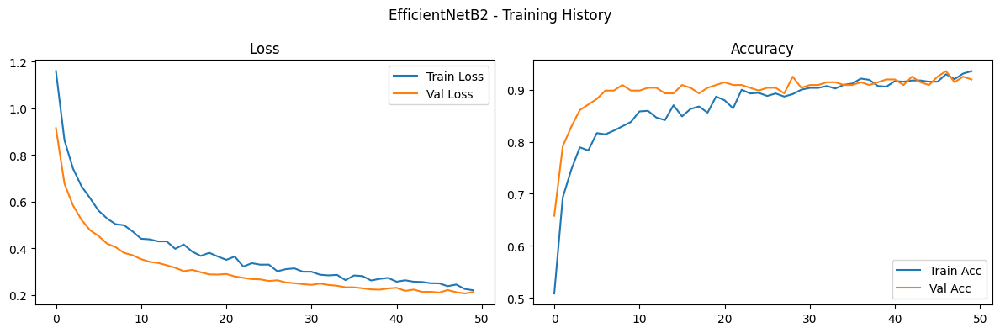

2026-01-07 14:35:41.238989: E tensorflow/core/framework/node_def_util.cc:680] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}


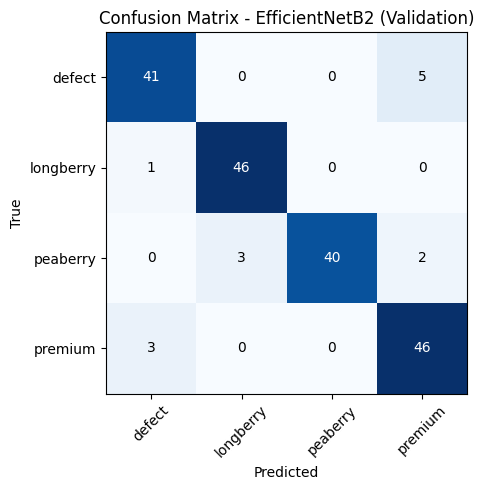

              precision    recall  f1-score   support

      defect     0.9111    0.8913    0.9011        46
   longberry     0.9388    0.9787    0.9583        47
    peaberry     1.0000    0.8889    0.9412        45
     premium     0.8679    0.9388    0.9020        49

    accuracy                         0.9251       187
   macro avg     0.9295    0.9244    0.9256       187
weighted avg     0.9281    0.9251    0.9254       187

✅ EfficientNetB2 selesai dilatih dan dievaluasi.

[EfficientNetB3] Memulai training | Input size: (300, 300)
43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/50


E0000 00:00:1767796560.438199      24 meta_optimizer.cc:967] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/EfficientNetB3_1/efficientnetb3_1/block1b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


27/27 ━━━━━━━━━━━━━━━━━━━━ 24s 339ms/step - accuracy: 0.4675 - loss: 1.2498 - val_accuracy: 0.7005 - val_loss: 0.8182 - learning_rate: 0.0010
Epoch 2/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 177ms/step - accuracy: 0.6988 - loss: 0.8430 - val_accuracy: 0.8610 - val_loss: 0.6004 - learning_rate: 0.0010
Epoch 3/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 177ms/step - accuracy: 0.7458 - loss: 0.7255 - val_accuracy: 0.8717 - val_loss: 0.5076 - learning_rate: 0.0010
Epoch 4/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - accuracy: 0.7814 - loss: 0.6253 - val_accuracy: 0.8930 - val_loss: 0.4653 - learning_rate: 0.0010
Epoch 5/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - accuracy: 0.7930 - loss: 0.5771 - val_accuracy: 0.9037 - val_loss: 0.4250 - learning_rate: 0.0010
Epoch 6/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - accuracy: 0.8253 - loss: 0.5238 - val_accuracy: 0.9198 - val_loss: 0.4040 - learning_rate: 0.0010
Epoch 7/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 177ms/step - accuracy: 0.8365 - loss: 0.5106 - val_accura

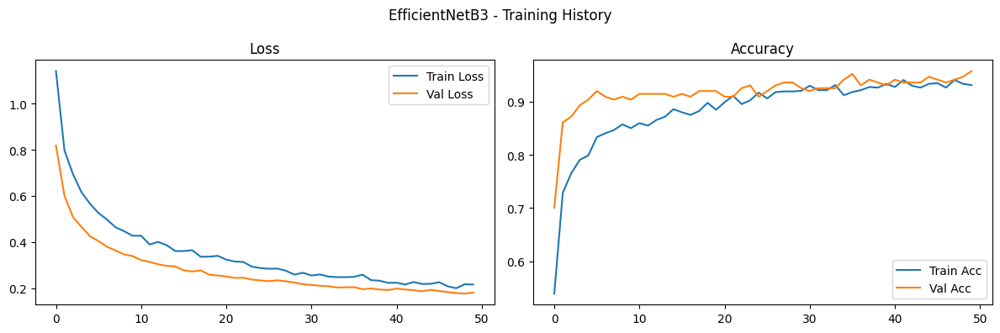

2026-01-07 14:40:07.196806: E tensorflow/core/framework/node_def_util.cc:680] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}


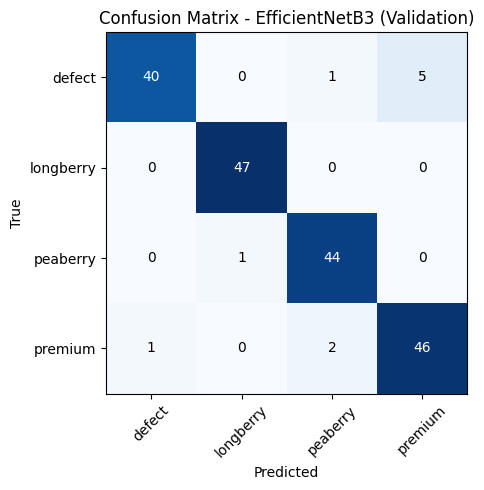

              precision    recall  f1-score   support

      defect     0.9756    0.8696    0.9195        46
   longberry     0.9792    1.0000    0.9895        47
    peaberry     0.9362    0.9778    0.9565        45
     premium     0.9020    0.9388    0.9200        49

    accuracy                         0.9465       187
   macro avg     0.9482    0.9465    0.9464       187
weighted avg     0.9477    0.9465    0.9461       187

✅ EfficientNetB3 selesai dilatih dan dievaluasi.

[MobileNetV2] Memulai training | Input size: (224, 224)
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - accuracy: 0.2726 - loss: 1.5816 - val_accuracy: 0.6631 - val_loss: 0.8988 - learning_rate: 0.0010
Epoch 2/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.5803 - loss: 1.0006 - val_accuracy: 0.7914 - val_loss: 0.6772 - learning_rate: 0.0010
Epoch 3/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - accuracy: 0.6946 - loss: 0.7903 - val_accuracy: 0.7968

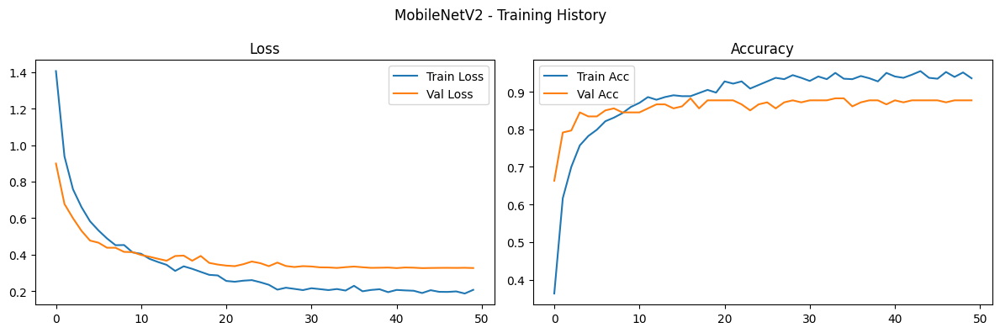

2026-01-07 14:41:23.139273: E tensorflow/core/framework/node_def_util.cc:680] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}


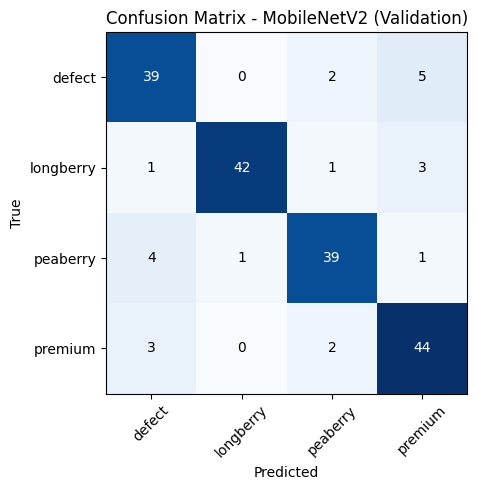

              precision    recall  f1-score   support

      defect     0.8298    0.8478    0.8387        46
   longberry     0.9767    0.8936    0.9333        47
    peaberry     0.8864    0.8667    0.8764        45
     premium     0.8302    0.8980    0.8627        49

    accuracy                         0.8770       187
   macro avg     0.8808    0.8765    0.8778       187
weighted avg     0.8804    0.8770    0.8779       187

✅ MobileNetV2 selesai dilatih dan dievaluasi.

🎉 Semua model telah selesai dilatih!
Model yang tersedia: ['ResNet50', 'EfficientNetB0', 'EfficientNetB1', 'EfficientNetB2', 'EfficientNetB3', 'MobileNetV2']


In [7]:
# =========================================
# [6] REGISTRY & TRAINING LOOP
# =========================================
models_registry = {}   # nama_model -> model object
history_registry = {}  # nama_model -> history object

# Daftar model yang akan dilatih
experiments = [
    {"name": "ResNet50",        "builder": build_resnet50,       "img_size": (224, 224)},
    {"name": "EfficientNetB0",  "builder": lambda: build_efficientnet("B0"), "img_size": EFFNET_IMG_SIZES["B0"]},
    {"name": "EfficientNetB1",  "builder": lambda: build_efficientnet("B1"), "img_size": EFFNET_IMG_SIZES["B1"]},
    {"name": "EfficientNetB2",  "builder": lambda: build_efficientnet("B2"), "img_size": EFFNET_IMG_SIZES["B2"]},
    {"name": "EfficientNetB3",  "builder": lambda: build_efficientnet("B3"), "img_size": EFFNET_IMG_SIZES["B3"]},
    {"name": "MobileNetV2",     "builder": build_mobilenetv2,    "img_size": (224, 224)},
]

callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=7,
        restore_best_weights=True,
        verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=3,
        min_lr=1e-7,
        verbose=1
    )
]

print(f"🚀 Mulai melatih {len(experiments)} model...\n")

for exp in experiments:
    name = exp["name"]
    img_size = exp["img_size"]
    print("="*60)
    print(f"[{name}] Memulai training | Input size: {img_size}")
    print("="*60)
    
    # Buat dataset khusus untuk model ini
    ds_train = create_dataset(train_df, target_size=img_size, training=True)
    ds_val   = create_dataset(val_df,   target_size=img_size, training=False)
    
    # Build model
    model = exp["builder"]()
    
    # Compile
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=LR),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )
    
    # Train
    history = model.fit(
        ds_train,
        validation_data=ds_val,
        epochs=EPOCHS,
        callbacks=callbacks,
        verbose=1
    )
    
    # Simpan ke registry
    models_registry[name] = model
    history_registry[name] = history
    
    # Evaluasi langsung
    print(f"\n📊 Evaluasi {name} pada validation set:")
    plot_history(history, title=f"{name} - Training History")
    evaluate_model(model, ds_val, dataset_name=f"{name} (Validation)")
    
    print(f"✅ {name} selesai dilatih dan dievaluasi.\n")

print("🎉 Semua model telah selesai dilatih!")
print("Model yang tersedia:", list(models_registry.keys()))

In [8]:
# =========================================
# [7] PERBANDINGAN SEMUA MODEL
# =========================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix

# Registry sudah terisi dari training sebelumnya
print(f"Model yang telah dilatih: {list(models_registry.keys())}\n")

# Fungsi helper untuk ekstrak metrik dari validation set
def get_val_metrics(model, ds_val):
    y_true = []
    y_pred = []
    
    for images, labels in ds_val:
        preds = model.predict(images, verbose=0)
        y_pred.extend(np.argmax(preds, axis=1))
        y_true.extend(labels.numpy())
    
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    # Classification report sebagai dict
    report = classification_report(y_true, y_pred, target_names=CLASS_NAMES, output_dict=True, zero_division=0)
    
    return {
        "accuracy": report["accuracy"],
        "macro_precision": report["macro avg"]["precision"],
        "macro_recall": report["macro avg"]["recall"],
        "macro_f1": report["macro avg"]["f1-score"],
        "weighted_f1": report["weighted avg"]["f1-score"],
        "y_true": y_true,
        "y_pred": y_pred,
        "report": report
    }

# Kumpulkan semua metrik
comparison_rows = []
per_class_f1 = {}
confusion_matrices = {}

print("🔄 Menghitung metrik validation untuk semua model...\n")

for name, model in models_registry.items():
    # Cari img_size yang sesuai dengan model (untuk buat ds_val yang benar)
    if "EfficientNet" in name:
        variant = name.replace("EfficientNet", "")
        img_size = EFFNET_IMG_SIZES.get(variant, (224, 224))
    else:
        img_size = (224, 224)
    
    ds_val = create_dataset(val_df, target_size=img_size, training=False)
    
    metrics = get_val_metrics(model, ds_val)
    
    # Ambil best val accuracy dari history (jika ada)
    history = history_registry.get(name)
    if history is not None:
        best_val_acc = max(history.history["val_accuracy"])
        best_val_loss = min(history.history["val_loss"])
    else:
        best_val_acc = np.nan
        best_val_loss = np.nan
    
    comparison_rows.append({
        "Model": name,
        "Best Val Acc": round(best_val_acc, 4),
        "Best Val Loss": round(best_val_loss, 4),
        "Accuracy": round(metrics["accuracy"], 4),
        "Macro Precision": round(metrics["macro_precision"], 4),
        "Macro Recall": round(metrics["macro_recall"], 4),
        "Macro F1": round(metrics["macro_f1"], 4),
        "Weighted F1": round(metrics["weighted_f1"], 4),
    })
    
    # Simpan untuk tabel per-class
    per_class_f1[name] = {cls: round(metrics["report"][cls]["f1-score"], 4) for cls in CLASS_NAMES}
    
    # Simpan confusion matrix
    cm = confusion_matrix(metrics["y_true"], metrics["y_pred"])
    confusion_matrices[name] = cm

# Buat DataFrame utama
df_comparison = pd.DataFrame(comparison_rows)
df_comparison = df_comparison.sort_values(by="Macro F1", ascending=False).reset_index(drop=True)

print("📊 TABEL PERBANDINGAN METRIK VALIDATION")
display(df_comparison)

Model yang telah dilatih: ['ResNet50', 'EfficientNetB0', 'EfficientNetB1', 'EfficientNetB2', 'EfficientNetB3', 'MobileNetV2']

🔄 Menghitung metrik validation untuk semua model...



2026-01-07 14:41:28.565005: E tensorflow/core/framework/node_def_util.cc:680] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}


📊 TABEL PERBANDINGAN METRIK VALIDATION


,Model,Best Val Acc,Best Val Loss,Accuracy,Macro Precision,Macro Recall,Macro F1,Weighted F1
0,EfficientNetB3,0.9572,0.1765,0.9465,0.9482,0.9465,0.9464,0.9461
1,EfficientNetB0,0.9465,0.1898,0.9412,0.9415,0.9413,0.9413,0.9411
2,ResNet50,0.9572,0.1808,0.9358,0.9363,0.9357,0.9357,0.9358
3,EfficientNetB2,0.9358,0.2062,0.9251,0.9295,0.9244,0.9256,0.9254
4,EfficientNetB1,0.9358,0.2481,0.9251,0.9278,0.9249,0.9251,0.9247
5,MobileNetV2,0.8824,0.3259,0.8770,0.8808,0.8765,0.8778,0.8779


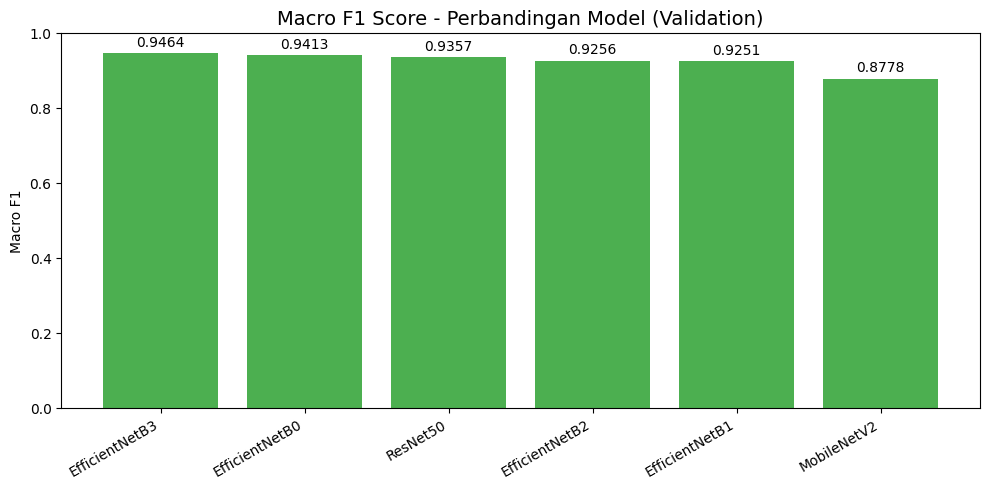

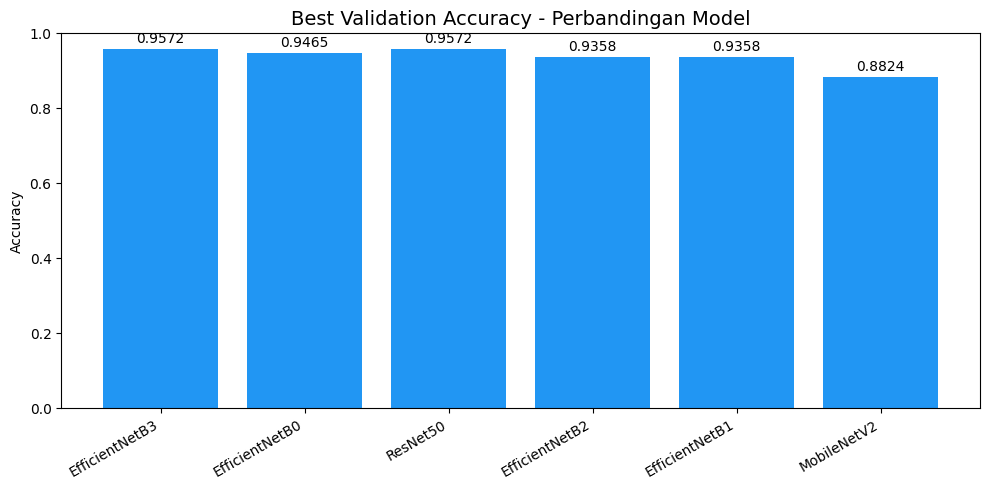

In [9]:
# =========================================
# [7b] BAR CHART PERBANDINGAN
# =========================================
plt.figure(figsize=(10, 5))
bars = plt.bar(df_comparison["Model"], df_comparison["Macro F1"], color="#4CAF50")
plt.title("Macro F1 Score - Perbandingan Model (Validation)", fontsize=14)
plt.ylabel("Macro F1")
plt.ylim(0, 1)
plt.xticks(rotation=30, ha="right")
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
             f'{height:.4f}', ha="center", va="bottom", fontsize=10)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))
bars = plt.bar(df_comparison["Model"], df_comparison["Best Val Acc"], color="#2196F3")
plt.title("Best Validation Accuracy - Perbandingan Model", fontsize=14)
plt.ylabel("Accuracy")
plt.ylim(0, 1)
plt.xticks(rotation=30, ha="right")
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
             f'{height:.4f}', ha="center", va="bottom", fontsize=10)
plt.tight_layout()
plt.show()

📈 CONFUSION MATRIX SETIAP MODEL



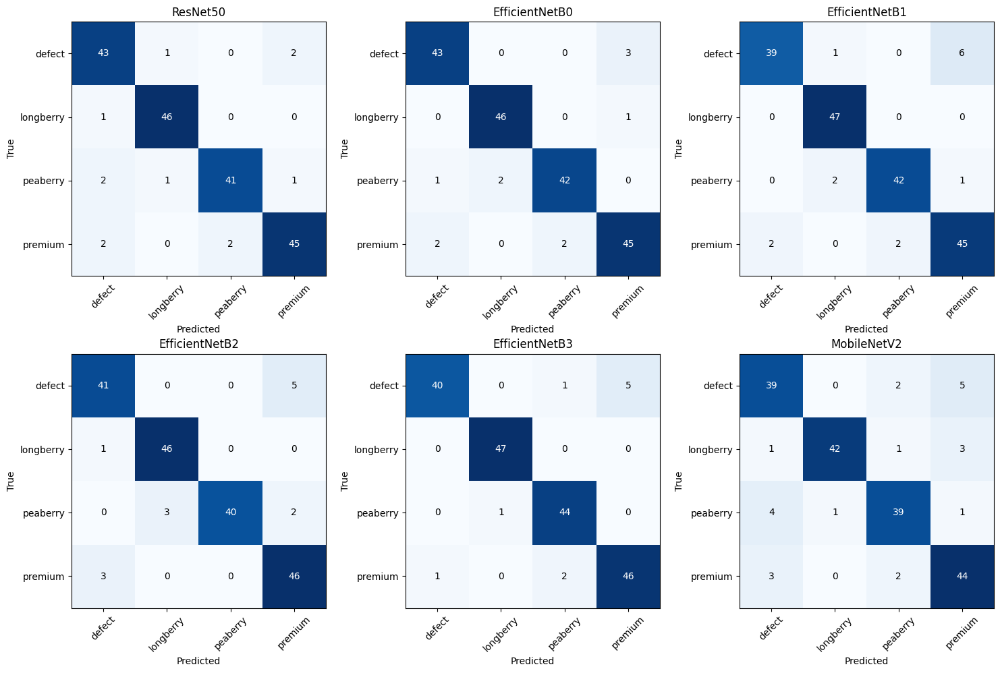

In [10]:
# =========================================
# [7c] CONFUSION MATRIX SEMUA MODEL
# =========================================
print("📈 CONFUSION MATRIX SETIAP MODEL\n")

n_models = len(confusion_matrices)
cols = 3
rows = (n_models + cols - 1) // cols

plt.figure(figsize=(cols * 5, rows * 5))

for idx, (name, cm) in enumerate(confusion_matrices.items(), 1):
    plt.subplot(rows, cols, idx)
    plt.imshow(cm, cmap="Blues")
    plt.title(f"{name}", fontsize=12)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.xticks(range(NUM_CLASSES), CLASS_NAMES, rotation=45)
    plt.yticks(range(NUM_CLASSES), CLASS_NAMES)
    
    # Annotate angka
    for i in range(NUM_CLASSES):
        for j in range(NUM_CLASSES):
            color = "white" if cm[i, j] > cm.max()/2 else "black"
            plt.text(j, i, cm[i, j], ha="center", va="center", color=color, fontsize=10)

plt.tight_layout()
plt.show()

In [11]:
# =========================================
# [7d] TABEL F1-SCORE PER KELAS
# =========================================
df_per_class = pd.DataFrame(per_class_f1).T
df_per_class = df_per_class[CLASS_NAMES]  # urutkan kolom sesuai CLASS_NAMES
df_per_class = df_per_class.loc[df_comparison["Model"]]  # urutkan baris sesuai ranking

print("📊 F1-SCORE PER KELAS (semakin tinggi semakin baik)")
display(df_per_class.style.background_gradient(cmap="Greens", axis=None))

📊 F1-SCORE PER KELAS (semakin tinggi semakin baik)


,defect,longberry,peaberry,premium
EfficientNetB3,0.919500,0.989500,0.956500,0.920000
EfficientNetB0,0.934800,0.968400,0.943800,0.918400
ResNet50,0.914900,0.968400,0.931800,0.927800
EfficientNetB2,0.901100,0.958300,0.941200,0.902000
EfficientNetB1,0.896600,0.969100,0.943800,0.891100
MobileNetV2,0.838700,0.933300,0.876400,0.862700


In [12]:
# =========================================
# [7e] EXPORT HASIL PERBANDINGAN
# =========================================
OUT_DIR = Path("./artifacts_modeling")
OUT_DIR.mkdir(exist_ok=True)

df_comparison.to_csv(OUT_DIR / "model_comparison_summary.csv", index=False)
df_per_class.to_csv(OUT_DIR / "model_comparison_per_class_f1.csv")

print(f"✅ File perbandingan disimpan di folder: {OUT_DIR}")
print("   ├── model_comparison_summary.csv")
print("   └── model_comparison_per_class_f1.csv")

✅ File perbandingan disimpan di folder: artifacts_modeling
   ├── model_comparison_summary.csv
   └── model_comparison_per_class_f1.csv


In [13]:
# =========================================
# [8a] COLLECT MISCLASSIFICATIONS
# =========================================
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

# Pasangan kesalahan target
TARGET_PAIRS = [
    ("defect", "premium"),
    ("premium", "defect"),
    ("longberry", "peaberry"),
    ("peaberry", "longberry"),
]

# ID kelas dari CLASS_NAMES
CLASS_ID_MAP = {name: idx for idx, name in enumerate(CLASS_NAMES)}

def get_predictions(model, df, img_size):
    """Hitung prediksi pada dataset"""
    ds = create_dataset(df, target_size=img_size, training=False)
    y_pred = []
    
    for x, _ in ds:
        prob = model.predict(x, verbose=0)
        y_pred.extend(np.argmax(prob, axis=1))
    
    return np.array(y_pred)

# Kumpulkan misclassified per model
misclassified = {}

print("🔄 Mengumpulkan kesalahan prediksi pada validation set...\n")

for name, model in models_registry.items():
    # Dapatkan img_size sesuai model
    if "EfficientNet" in name:
        variant = name.replace("EfficientNet", "")
        img_size = EFFNET_IMG_SIZES.get(variant, (224, 224))
    else:
        img_size = (224, 224)
    
    y_true = val_df["class_id"].values
    y_pred = get_predictions(model, val_df, img_size)
    
    # Filter hanya kesalahan di TARGET_PAIRS
    records = []
    for i in range(len(y_true)):
        true_cls = CLASS_NAMES[y_true[i]]
        pred_cls = CLASS_NAMES[y_pred[i]]
        if (true_cls, pred_cls) in TARGET_PAIRS:
            records.append({
                "filepath": val_df.iloc[i]["filepath"],
                "filename": val_df.iloc[i]["filename"],
                "true": true_cls,
                "pred": pred_cls
            })
    
    misclassified[name] = pd.DataFrame(records)
    print(f"{name}: {len(records)} kesalahan pada pasangan target")

print("\n✅ Pengumpulan selesai.")

🔄 Mengumpulkan kesalahan prediksi pada validation set...



2026-01-07 14:41:36.014455: E tensorflow/core/framework/node_def_util.cc:680] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}


ResNet50: 5 kesalahan pada pasangan target
EfficientNetB0: 7 kesalahan pada pasangan target
EfficientNetB1: 10 kesalahan pada pasangan target
EfficientNetB2: 11 kesalahan pada pasangan target
EfficientNetB3: 7 kesalahan pada pasangan target
MobileNetV2: 10 kesalahan pada pasangan target

✅ Pengumpulan selesai.


2026-01-07 14:41:41.147904: E tensorflow/core/framework/node_def_util.cc:680] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}


MODEL: ResNet50


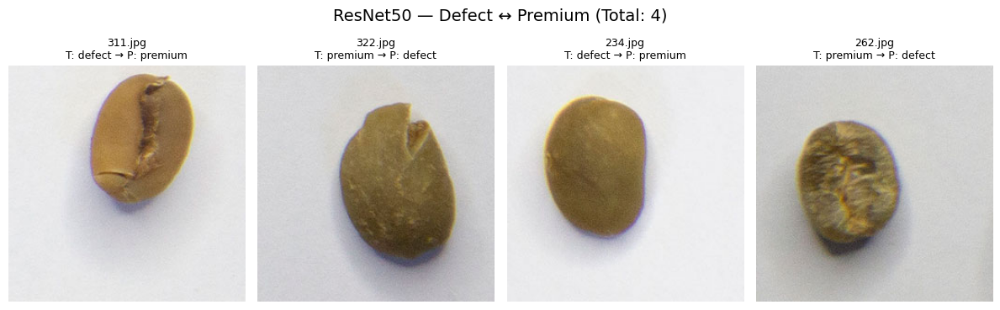

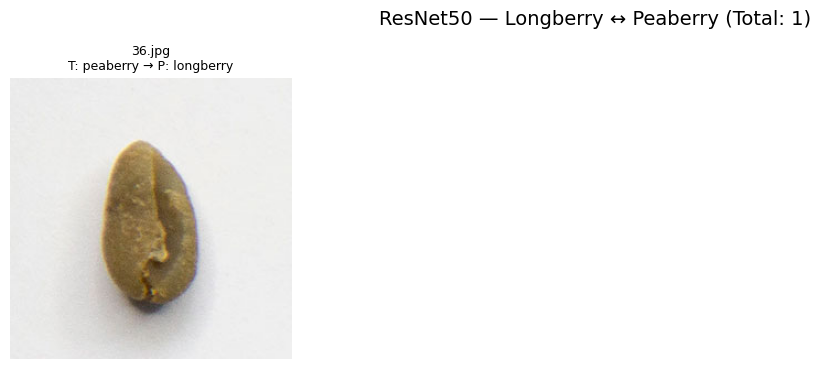

MODEL: EfficientNetB0


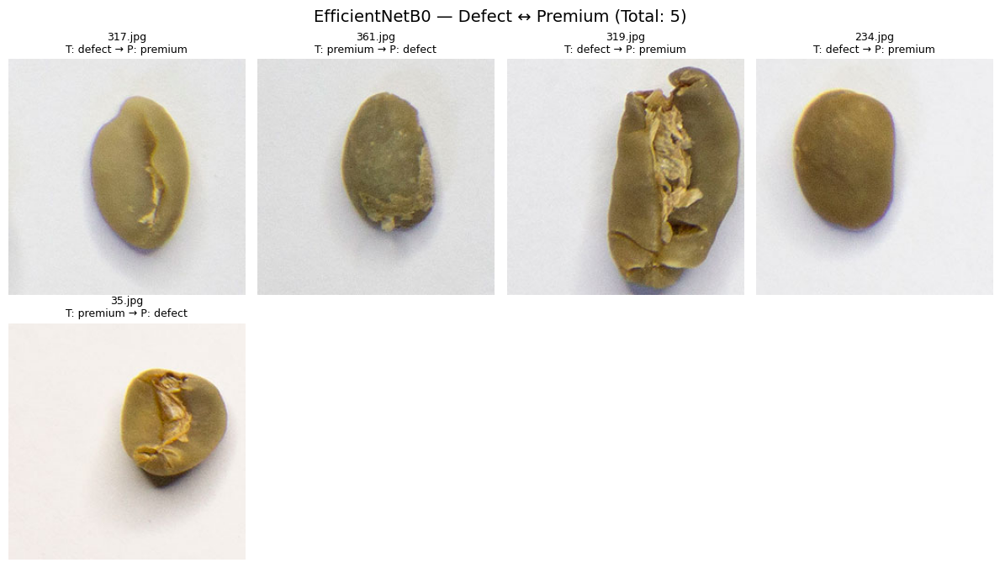

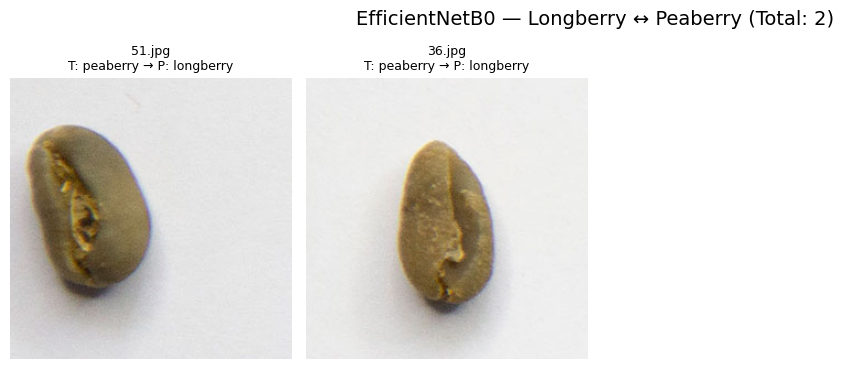

MODEL: EfficientNetB1


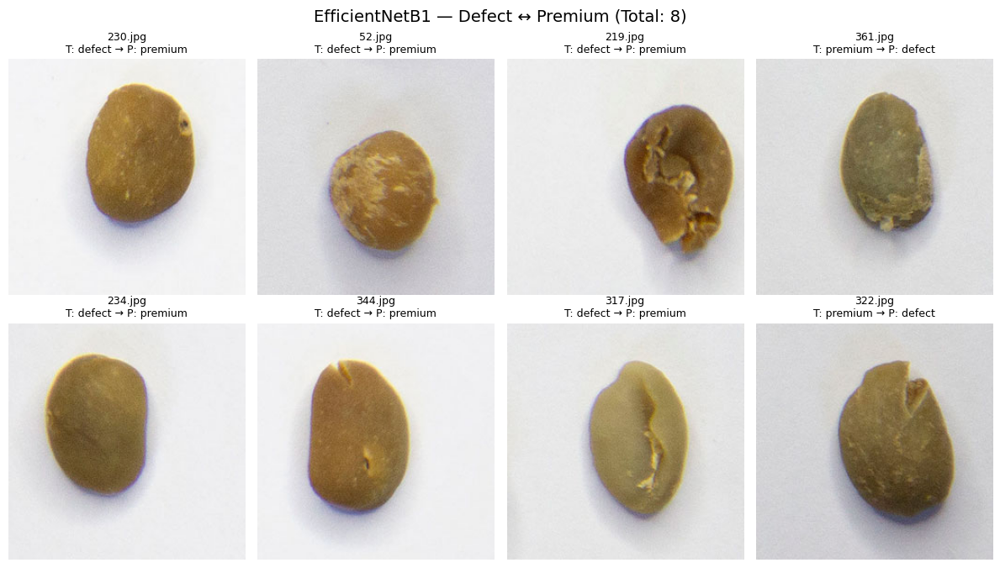

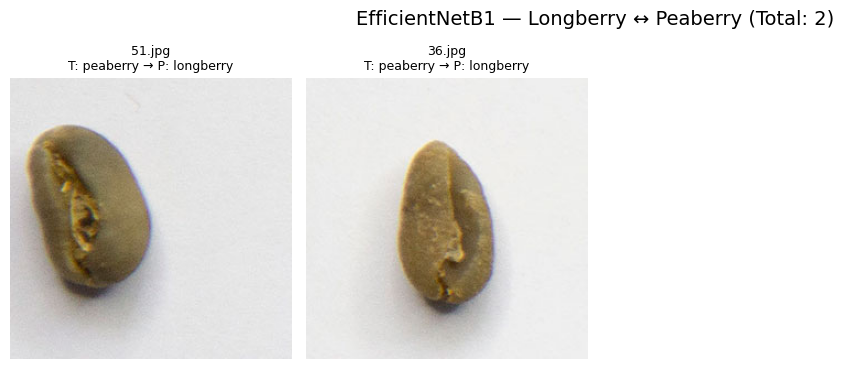

MODEL: EfficientNetB2


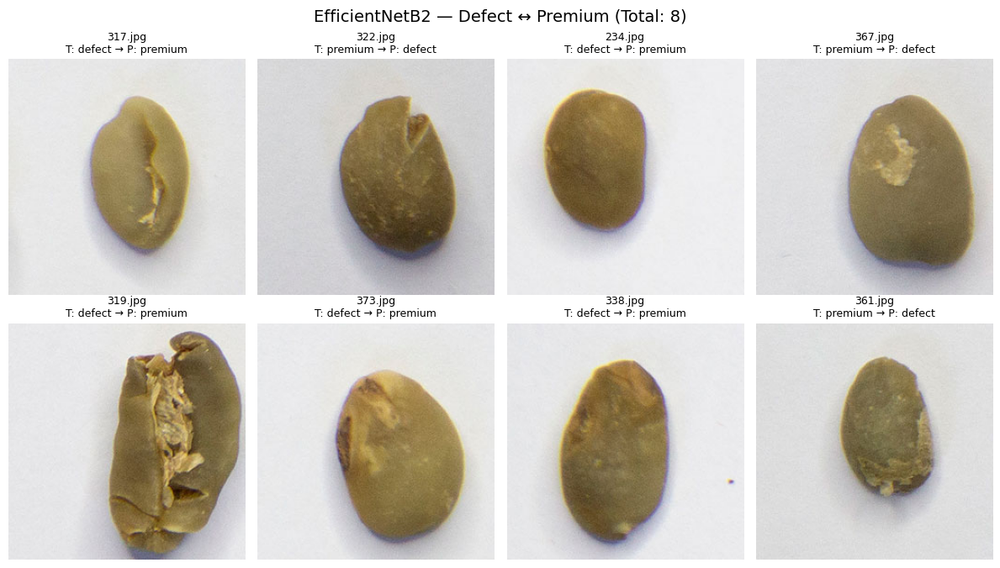

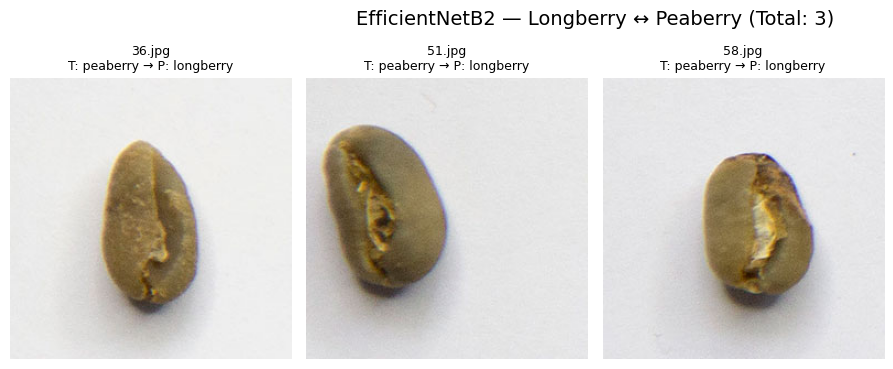

MODEL: EfficientNetB3


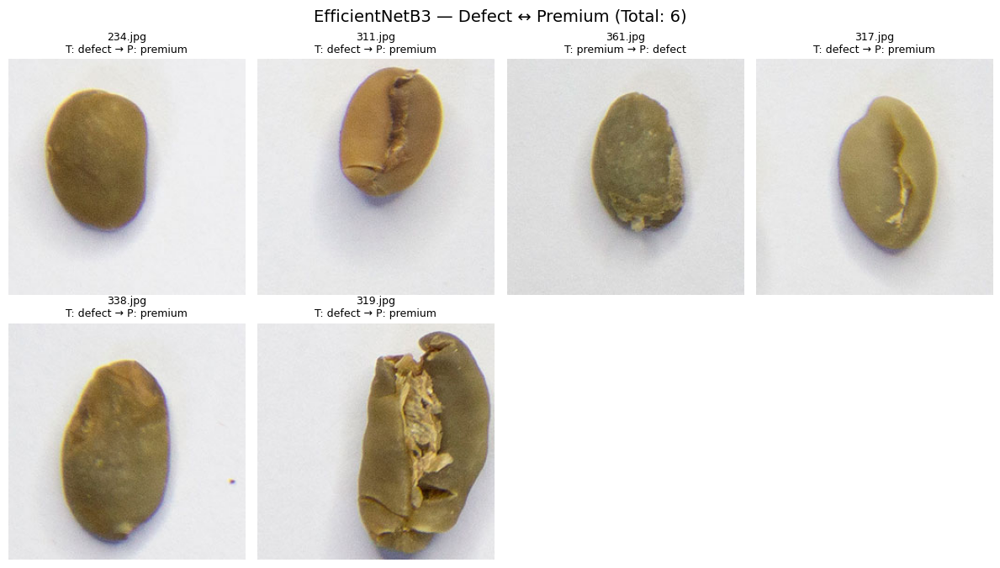

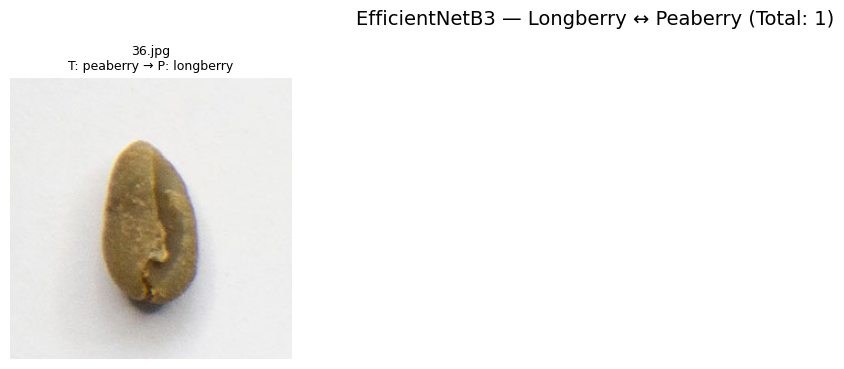

MODEL: MobileNetV2


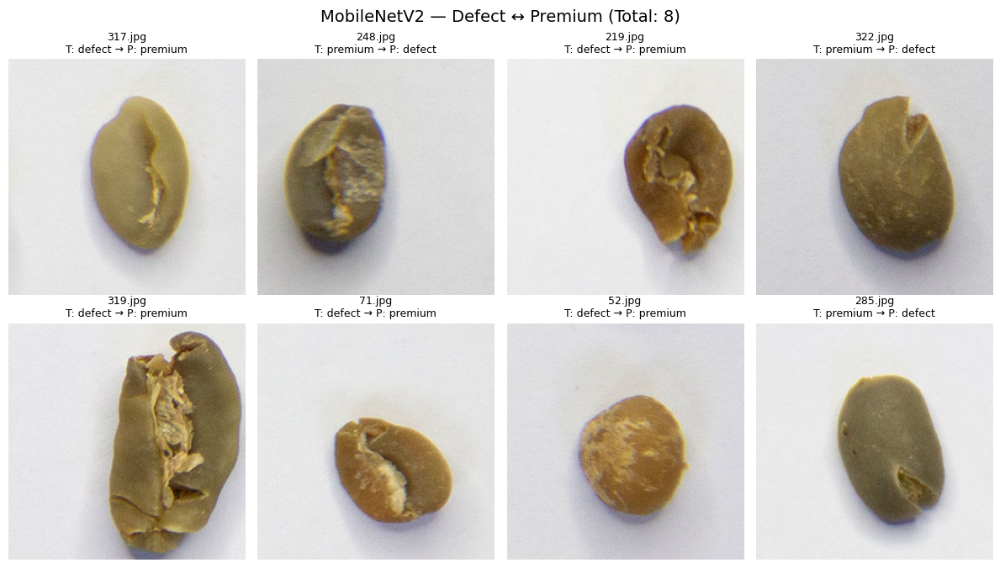

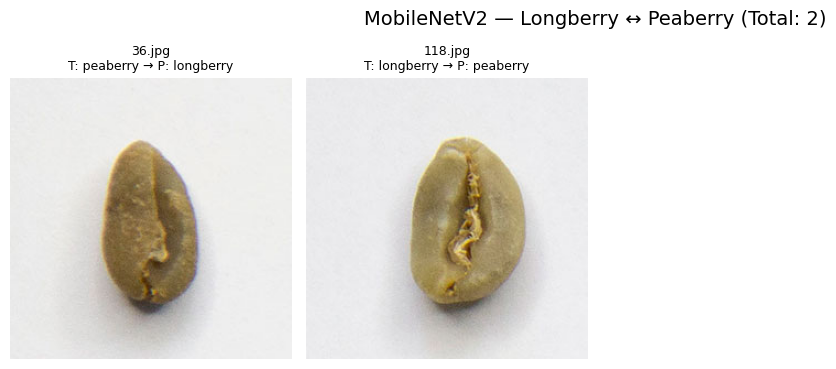

In [14]:
# =========================================
# [8b] VISUALISASI GRID GAMBAR
# =========================================
def show_misclass_grid(df, title, n=12, cols=4):
    """Tampilkan grid gambar misclassified"""
    if len(df) == 0:
        print(f"✅ No misclassifications for {title}")
        return
    
    # Sample random jika terlalu banyak
    df_sample = df.sample(min(n, len(df)), random_state=SEED)
    rows = int(np.ceil(len(df_sample) / cols))
    
    plt.figure(figsize=(cols * 3, rows * 3 + 1))
    for idx, row in enumerate(df_sample.itertuples(), 1):
        try:
            img = Image.open(row.filepath).convert("RGB")
            plt.subplot(rows, cols, idx)
            plt.imshow(img)
            plt.axis("off")
            plt.title(f"{row.filename}\nT: {row.true} → P: {row.pred}", fontsize=9)
        except Exception as e:
            print(f"⚠️ Error loading {row.filepath}: {e}")
    
    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

# Tampilkan per pasangan per model
for name, df_err in misclassified.items():
    print("=" * 80)
    print(f"MODEL: {name}")
    print("=" * 80)
    
    # Filter defect ↔ premium
    df_dp = df_err[
        ((df_err["true"] == "defect") & (df_err["pred"] == "premium")) |
        ((df_err["true"] == "premium") & (df_err["pred"] == "defect"))
    ]
    show_misclass_grid(df_dp, f"{name} — Defect ↔ Premium (Total: {len(df_dp)})")
    
    # Filter longberry ↔ peaberry
    df_lp = df_err[
        ((df_err["true"] == "longberry") & (df_err["pred"] == "peaberry")) |
        ((df_err["true"] == "peaberry") & (df_err["pred"] == "longberry"))
    ]
    show_misclass_grid(df_lp, f"{name} — Longberry ↔ Peaberry (Total: {len(df_lp)})")

Menampilkan contoh prediksi benar untuk model-model terbaik:



2026-01-07 14:41:48.082769: E tensorflow/core/framework/node_def_util.cc:680] NodeDef mentions attribute use_unbounded_threadpool which is not in the op definition: Op<name=MapDataset; signature=input_dataset:variant, other_arguments: -> handle:variant; attr=f:func; attr=Targuments:list(type),min=0; attr=output_types:list(type),min=1; attr=output_shapes:list(shape),min=1; attr=use_inter_op_parallelism:bool,default=true; attr=preserve_cardinality:bool,default=false; attr=force_synchronous:bool,default=false; attr=metadata:string,default=""> This may be expected if your graph generating binary is newer  than this binary. Unknown attributes will be ignored. NodeDef: {{node ParallelMapDatasetV2/_14}}



CORRECT PREDICTIONS — MODEL: EFFICIENTNETB0
Total gambar yang benar diprediksi: 176 / 187 (94.1%)


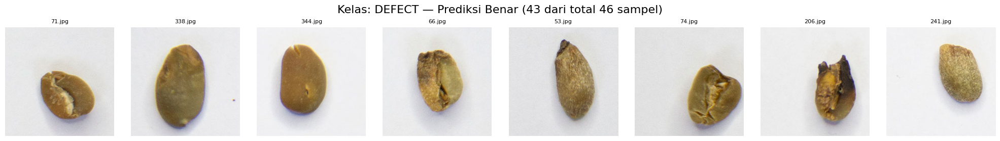

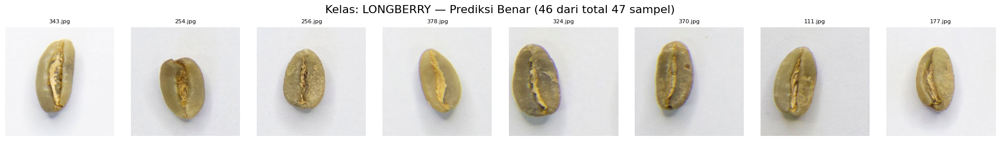

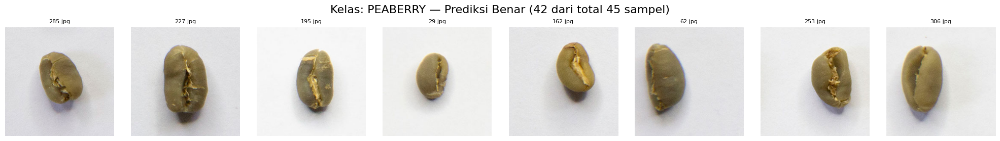

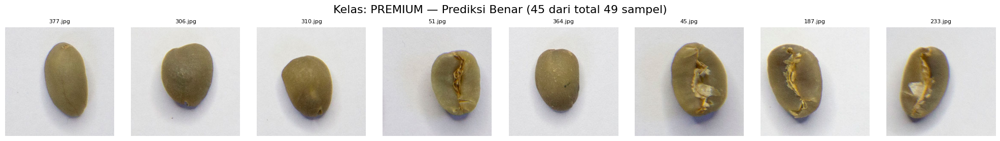


CORRECT PREDICTIONS — MODEL: EFFICIENTNETB3
Total gambar yang benar diprediksi: 177 / 187 (94.7%)


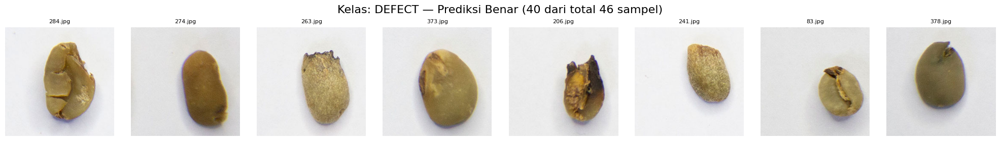

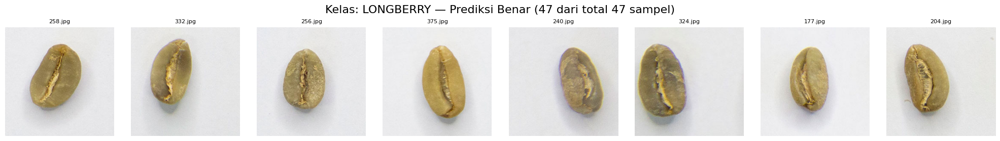

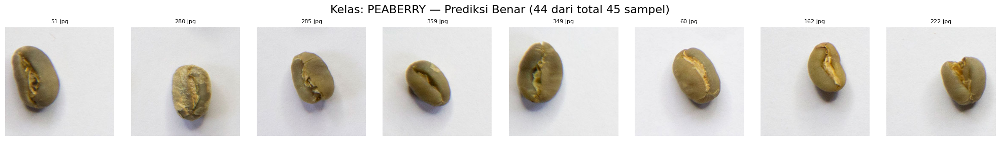

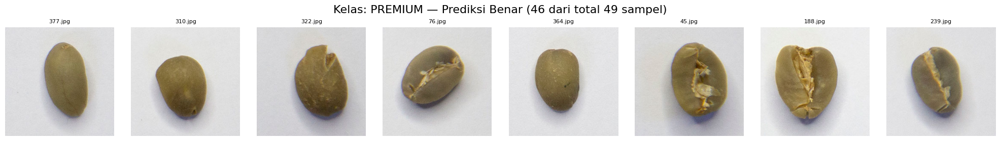

In [15]:
# =========================================
# [10] ANALISIS GAMBAR YANG BENAR DIPREDIKSI (Correct Predictions)
# =========================================
import random

def show_correct_samples(model_name, n_per_class=6, cols=6):
    """
    Tampilkan sampel gambar yang DIPREDIKSI BENAR oleh model tertentu
    dari validation set, sebanyak n_per_class per kelas.
    """
    if model_name not in models_registry:
        print(f"⚠️ Model {model_name} tidak ditemukan.")
        return
    
    model = models_registry[model_name]
    
    # Dapatkan img_size sesuai model
    if "EfficientNet" in model_name:
        variant = model_name.replace("EfficientNet", "")
        img_size = EFFNET_IMG_SIZES.get(variant, (224, 224))
    else:
        img_size = (224, 224)
    
    # Hitung prediksi sekali untuk seluruh val_df
    ds_val = create_dataset(val_df, target_size=img_size, training=False)
    y_pred = []
    for x, _ in ds_val:
        prob = model.predict(x, verbose=0)
        y_pred.extend(np.argmax(prob, axis=1))
    y_pred = np.array(y_pred)
    y_true = val_df["class_id"].values
    
    # Filter hanya yang benar
    correct_mask = (y_true == y_pred)
    df_correct = val_df[correct_mask].copy()
    df_correct["pred_class"] = y_pred[correct_mask]
    
    print("\n" + "="*100)
    print(f"CORRECT PREDICTIONS — MODEL: {model_name.upper()}")
    print(f"Total gambar yang benar diprediksi: {len(df_correct)} / {len(val_df)} ({100*len(df_correct)/len(val_df):.1f}%)")
    print("="*100)
    
    # Plot per kelas
    for cls_name in CLASS_NAMES:
        df_cls = df_correct[df_correct["class_name"] == cls_name]
        if len(df_cls) == 0:
            print(f"⚠️ Tidak ada prediksi benar untuk kelas '{cls_name}'")
            continue
        
        # Sample
        samples = df_cls.sample(min(n_per_class, len(df_cls)), random_state=SEED)
        rows = int(np.ceil(len(samples) / cols))
        
        plt.figure(figsize=(cols * 2.5, rows * 2.8))
        plt.suptitle(f"Kelas: {cls_name.upper()} — Prediksi Benar ({len(df_cls)} dari total { (val_df['class_name']==cls_name).sum() } sampel)", 
                     fontsize=16, y=0.98)
        
        for idx, row in enumerate(samples.itertuples(), 1):
            try:
                img = Image.open(row.filepath).convert("RGB")
                plt.subplot(rows, cols, idx)
                plt.imshow(img)
                plt.axis("off")
                plt.title(row.filename, fontsize=8)
            except Exception as e:
                print(f"Error loading {row.filepath}: {e}")
        
        plt.tight_layout()
        plt.show()

# Tampilkan untuk model terbaik + satu lagi untuk perbandingan
print("Menampilkan contoh prediksi benar untuk model-model terbaik:\n")

show_correct_samples("EfficientNetB0", n_per_class=8, cols=8)
show_correct_samples("EfficientNetB3", n_per_class=8, cols=8)
# Opsional: tambahkan yang lain jika ingin bandingkan
# show_correct_samples("ResNet50", n_per_class=8, cols=8)